# visualize surprisal development


In [1]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

ROOT = Path("/Users/jliu/workspace/RAG/")

In [2]:
data = pd.read_csv(ROOT / "results/EleutherAI/pythia-70m-deduped.csv")
data["log_step"] = np.log10(data["step"] + 1e-10)
data = data[(data["log_step"] > 0)]

In [5]:
def plot_surprisal_by_word(data: pd.DataFrame, output_dir=None) -> None:
    """Plot mean surprisal across log steps for each target word with context annotation."""

    # Create output directory if specified
    if output_dir is not None:
        output_dir.mkdir(exist_ok=True, parents=True)

    # Group by target word
    data_grouped = data.groupby("target_word")

    for word, data_group in data_grouped:
        # Get unique contexts for this word
        context = set(data_group["context"])

        # Format context set as a readable string
        context_str = "\n ".join(sorted(context))
        print(context_str)
        # Calculate mean surprisal by log step
        df = data_group.groupby("log_step")["surprisal"].mean().reset_index()

        # Plot surprisal curve
        plt.plot(df["log_step"], df["surprisal"])
        # Customize the plot
        plt.title(f"Surprisal for '{word}'")
        plt.xlabel("Log step")
        plt.ylabel("Mean Surprisal")
        plt.tight_layout()

        # Save figure if output directory is provided
        if output_dir is not None:
            fig_path = output_dir / f"{word}_surprisal.png"
            plt.savefig(fig_path, dpi=300)

        plt.show()


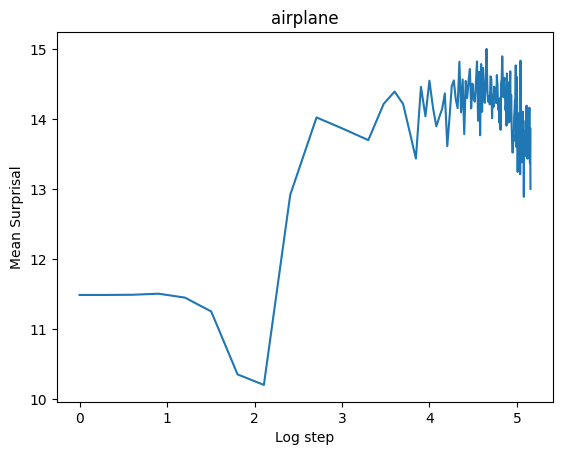

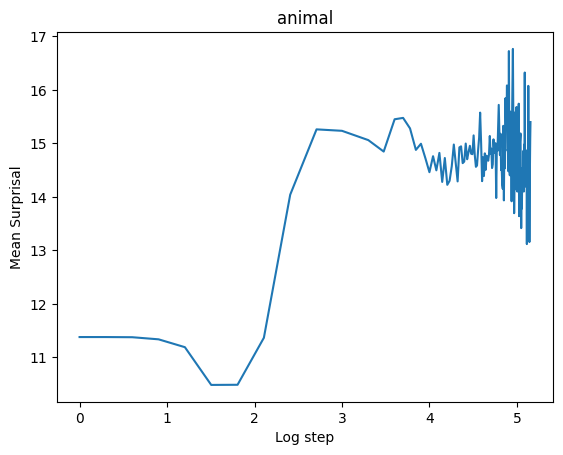

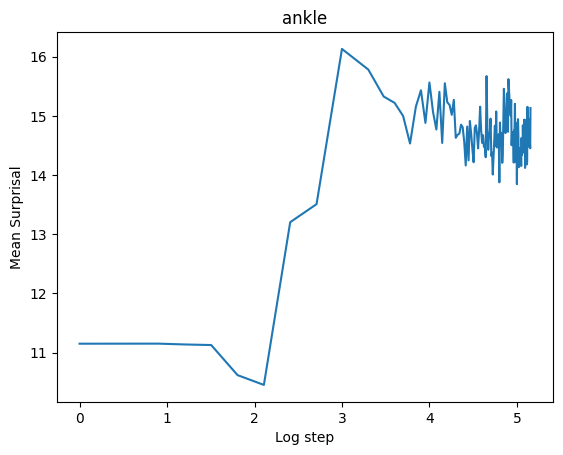

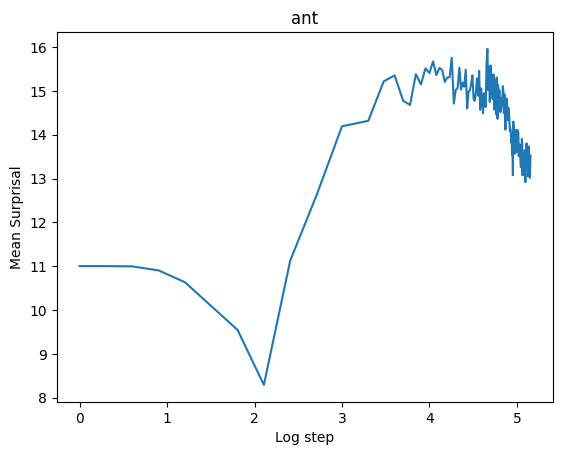

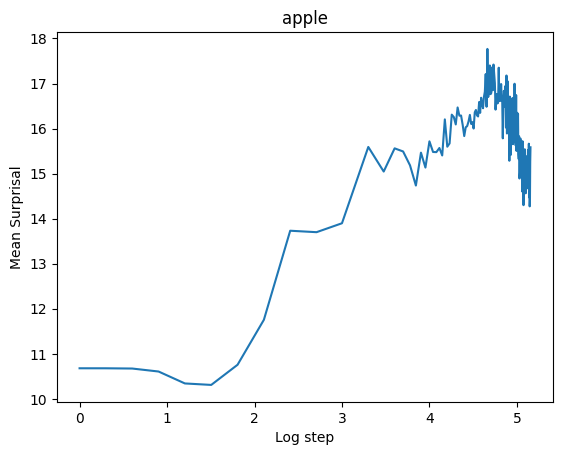

...

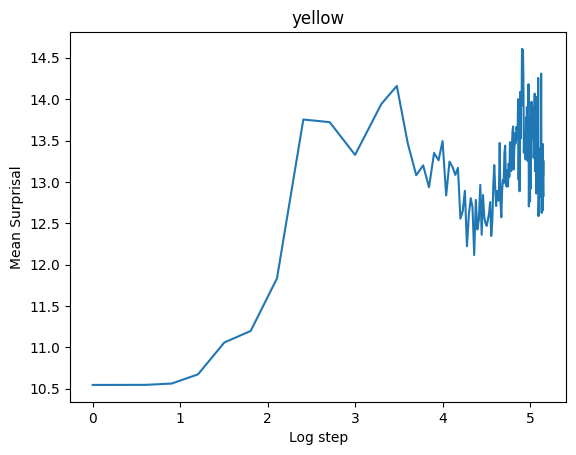

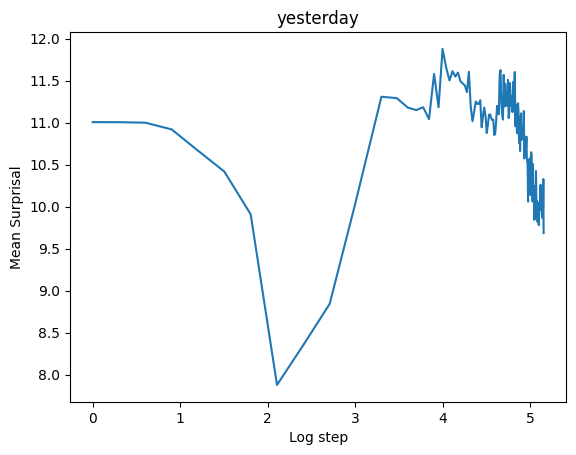

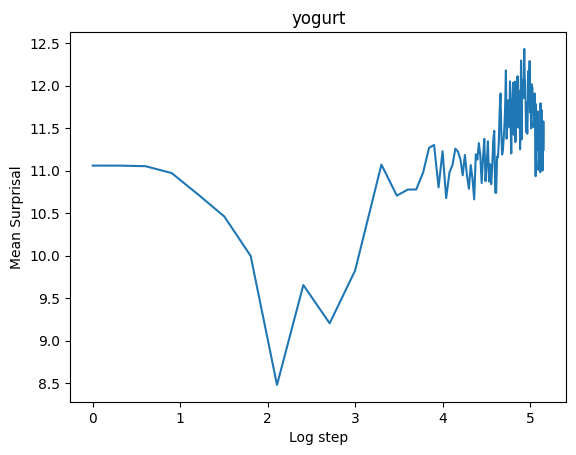

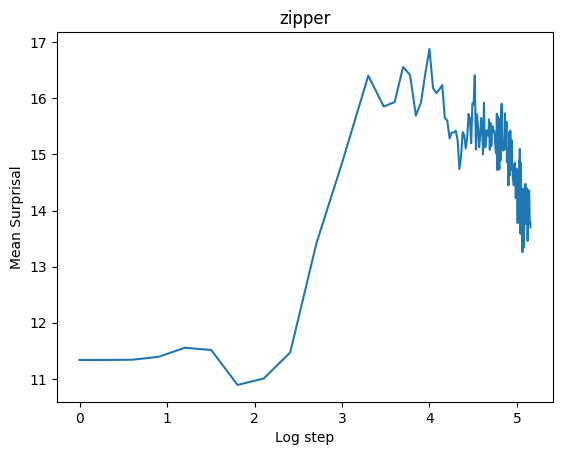

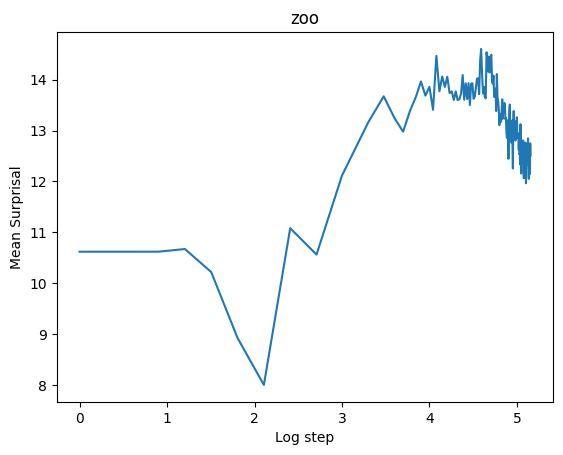

In [6]:
# loop over differnt words
data_grouped = data.groupby("target_word")
for word, data_group in data_grouped:
    context = set(data_group["context"])
    # Format context set as a readable string
    context_str = "\n ".join(sorted(context))
    df = data_group.groupby("log_step")["surprisal"].mean().reset_index()
    # Create the plot
    plt.plot(df["log_step"], df["surprisal"])
    # Customize the plot
    plt.title(word)
    plt.xlabel("Log step")
    plt.ylabel("Mean Surprisal")
    plt.show()
